# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Project Steps
* Camera calibration
* Distortion correction
* Color/gradient threshold
* Perspective transform

---
## 1. the camera calibration using chessboard images

![Distortion Examples](examples/distorted example.png)
![Distortion Examples](examples/distorted example2.png)

![Distortion Examples](examples/Camera Matrix.png)
![Distortion Examples](examples/Convex Lens.png)
![Distortion Examples](examples/Radiial Distortion.png)
![Distortion Examples](examples/tangentail Distortion.png)

\begin{align}
Distortion_{coefficients}&=(k_1, k_2, p_1, p_2, k_3)\\
\end{align}


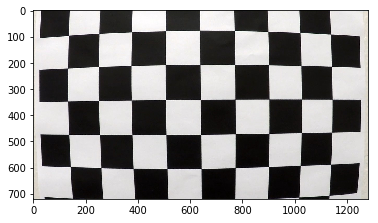

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

test_img = mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(test_img)

In [2]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
img_size = (test_img.shape[1], test_img.shape[0])


In [3]:
def camera_cal(img,mnx,ny):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    return ret,corners


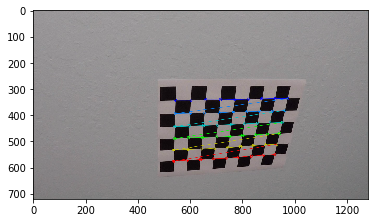

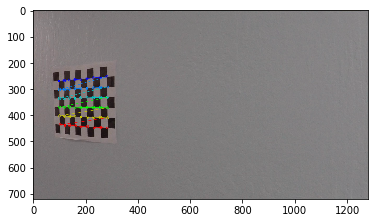

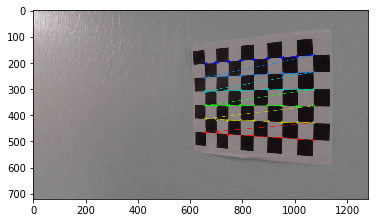

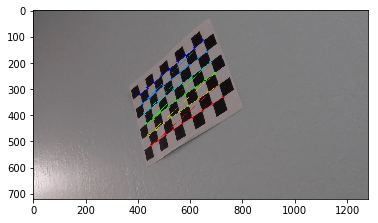

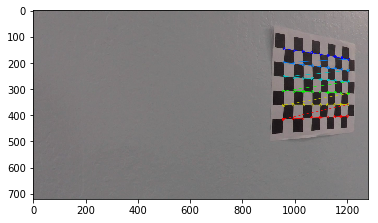

...

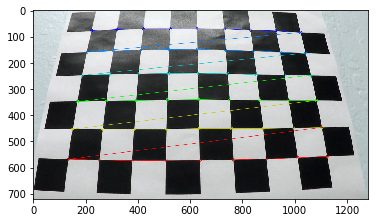

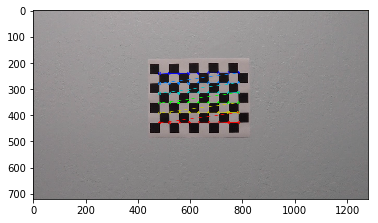

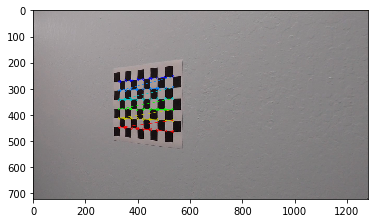

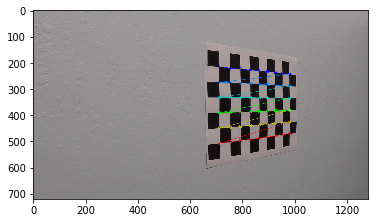

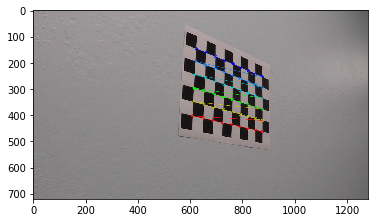

In [4]:
import pickle

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    

    # Find the chessboard corners
    ret, corners = camera_cal(img,nx,ny)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        cv2.imwrite('output_images/calibration'+str(i)+'.jpg',img)

        plt.imshow(img)
        plt.show()

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "output/wide_dist_pickle.p", "wb" ) )

## 2. Distortion correction

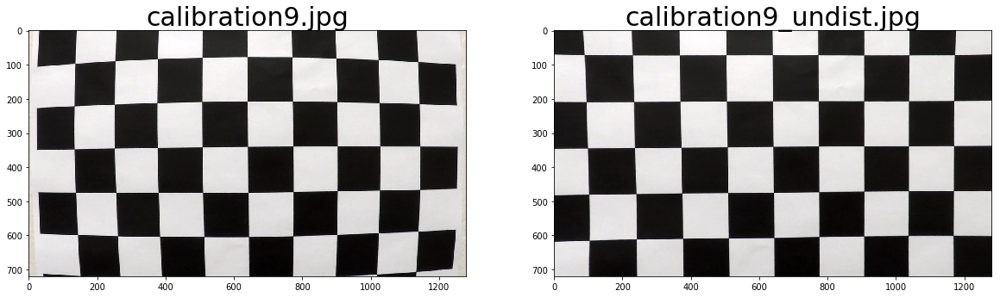

In [5]:

img = cv2.imread('camera_cal/calibration1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

undist = cv2.undistort(img, mtx, dist, None, mtx)

title= images[i].split('\\')[1]

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title(title, fontsize=30)
ax2.imshow(undist)
ax2.set_title(title.split('.')[0]+'_undist.jpg', fontsize=30)

plt.savefig('output_images/cal_undist_fig.png')

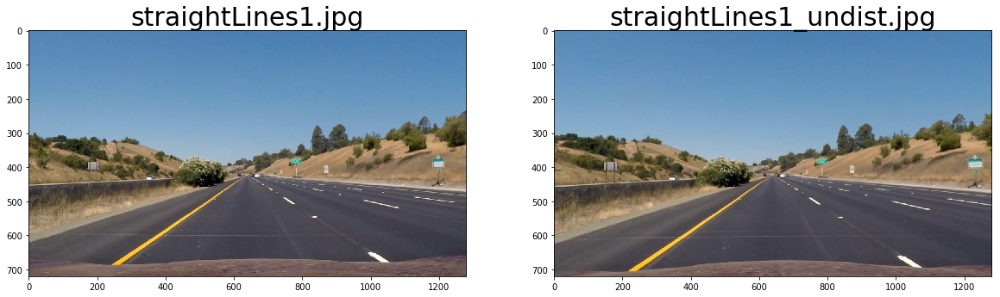

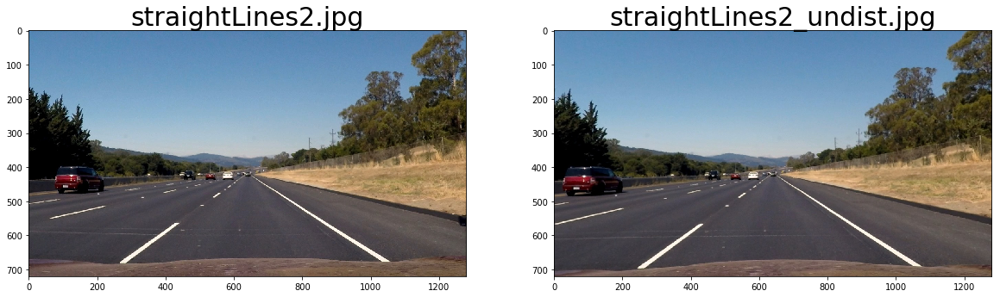

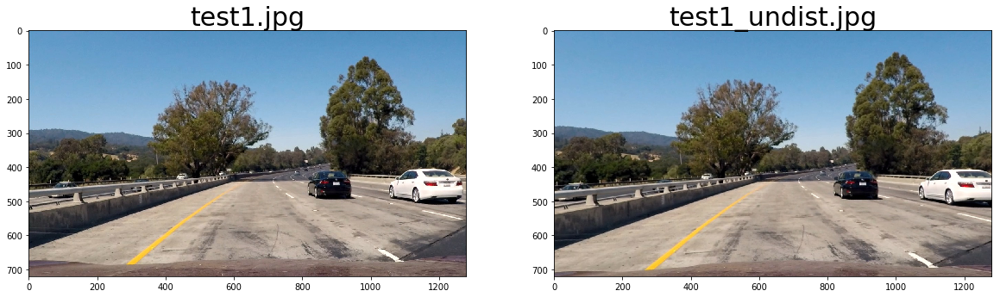

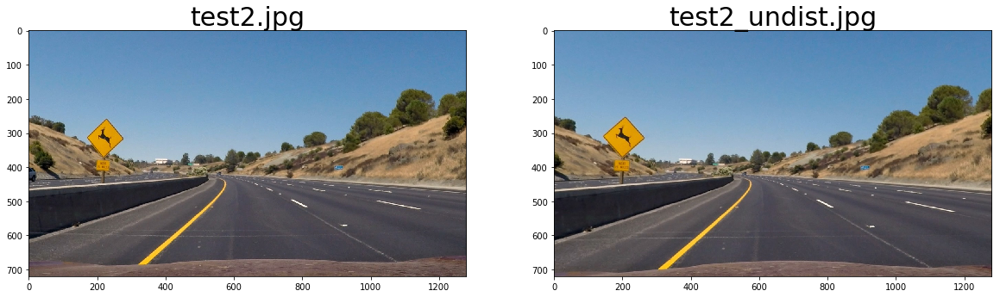

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


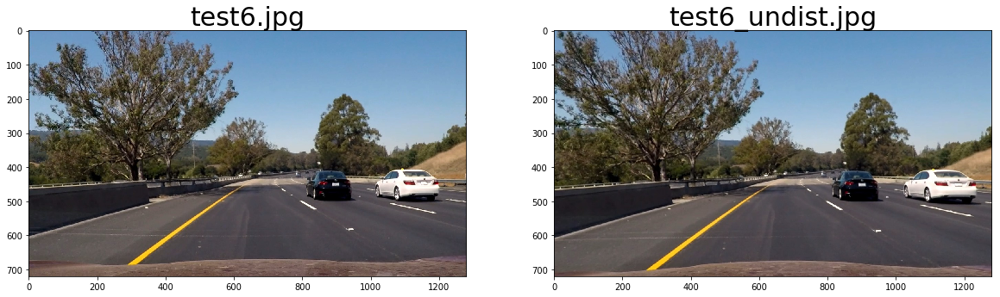

In [6]:
images = glob.glob('test_images/*.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    test_img_undist = cv2.undistort(test_img, mtx, dist, None, mtx)
    title= images[i].split('\\')[1]

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_undist)
    ax2.set_title(title.split('.')[0]+'_undist.jpg', fontsize=30)
    
    test_img_undist = cv2.cvtColor(test_img_undist, cv2.COLOR_RGB2BGR)
    
    cv2.imwrite('output_images/'+title.split('.')[0]+'_undist.jpg',test_img_undist)
    

## 3.Color/gradient threshold
line은 vertical 속성을 갖고 있음.
`cv2.Sobel()`은 Gray만 받음

In [7]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3,thresh=(20,100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

In [8]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


In [9]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0.7, 1.3)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

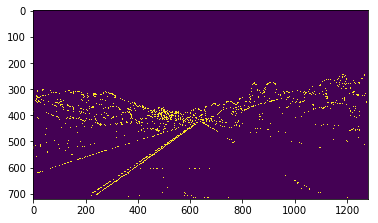

In [10]:
img = cv2.imread('output_images\\straightLines1_undist.jpg')
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)

lower_white = np.array([0,210,0], dtype=np.uint8)
upper_white = np.array([255,255,255], dtype=np.uint8)
white_mask = cv2.inRange(hls, lower_white, upper_white)

combined_binary = np.zeros_like(white_mask)

gradx = abs_sobel_thresh(img, orient='x',  thresh=(30, 100))
grady = abs_sobel_thresh(img, orient='y',  thresh=(30, 100))
dir_mask = dir_threshold(img)
mag_mask = mag_thresh(img)
combined_binary[((gradx == 1) & (grady == 1))|((dir_mask == 1) & (mag_mask == 1))] = 255
plt.imshow(combined_binary)


HLS color space
Isolates the lightness (L) component, which varies the most under different lighting condition.
H and S channels stay fairly consistent in shadow or excessice brightness

![Examples](examples/Color_space_ex1.png)

노란색 선에 대해서는 RGB channel 중에서 B에는 나타나지 않고
R,G channel에선 차량 전방의 햇빛에 의한 영향에 나타나는 것을 알 수 있습니다,

RGB color space
![Examples](examples/Color_space_ex2.png)

이와 다르게 색을 표현할 수도 있습니다.
HSV and HLS color space
![Examples](examples/Color_space_ex3.png)

HLS의 경우 hue, lightness, saturation을 나타냅니다.

HLS의 경우 image 분석에서 가장 commonly하게 사용되는 color space 입니다.

HLS는 H는 빛의 영향에 따라 그 값이 변하지만
L과 S channel은 그림자나 과도한 빛에 의한 영향이 적게 나타나는 것이 특징입니다.

따라서 H channel을 제외한 후 image 분석을 수행하면 RGB color space보다 더 믿음직 한 결과를 얻을 수 있습니다.
![Examples](examples/Color_space_ex4.png)

극단적인 예시를 살펴보면 
* gray 변환을 통한 th 기법
* RGB color space 중 R channel을 이용한 th 기법
* HLS color space 중 S channel을 이용한 th 기법
* HLS color space 중 H channel을 이용한 th 기법

![Examples](examples/Color_space_ex5.png)

이 중 H channel에 대한 th 기법이 가장 신뢰성이 높은 것을 알 수 있다.


In [11]:
def threshold(img_input, color=False, mag_dir_thresh=True):
    """Threshhold image on saturation channel and 
    using magnitude gradient"""
    img = np.copy(img_input)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    
    
    ## White Color
    lower_white = np.array([0,210,0], dtype=np.uint8)
    upper_white = np.array([255,255,255], dtype=np.uint8)
    white_mask = cv2.inRange(hls, lower_white, upper_white)
    
    ## Yellow Color
    lower_yellow = np.array([18,0,100], dtype=np.uint8)
    upper_yellow = np.array([30,220,255], dtype=np.uint8)
    yellow_mask = cv2.inRange(hls, lower_yellow, upper_yellow)  
    
    
    Dir_Mag_mask = np.zeros_like(white_mask)
    Dir_Mag_binary = np.zeros_like(white_mask)
    Color_binary = np.zeros_like(white_mask)

    
    # Dir Mag Threshold
    if mag_dir_thresh:
        gradx = abs_sobel_thresh(img, orient='x')
        grady = abs_sobel_thresh(img, orient='y')
        dir_mask = dir_threshold(img)
        mag_mask = mag_thresh(img)
        Dir_Mag_mask[((gradx == 1) & (grady == 1))|((dir_mask == 1) & (mag_mask == 1))] = 255
        
    if color:
        return np.dstack((white_mask, yellow_mask, Dir_Mag_mask))
    
    else:
        Color_binary[((white_mask == 255) | (yellow_mask == 255))] = 220
        Dir_Mag_binary[(Dir_Mag_mask==255)]=80
        combined_binary = Dir_Mag_binary+Color_binary
        combined_binary[(combined_binary >= 255)] = 255
        return combined_binary

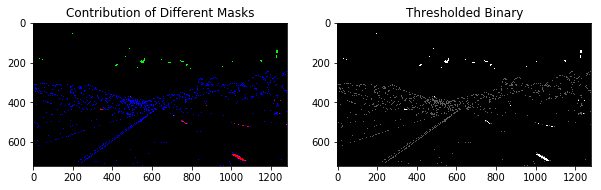

In [12]:
test_img = cv2.imread('output_images\\straightLines1_undist.jpg')

plt.figure(figsize=(10,40))
plt.subplot(1,2,1)
thresholded = threshold(test_img, color=True)
plt.imshow(thresholded)
plt.title('Contribution of Different Masks')

plt.subplot(1,2,2)
b_thresholded = threshold(test_img)
plt.imshow(b_thresholded, cmap='gray')
plt.title('Thresholded Binary')

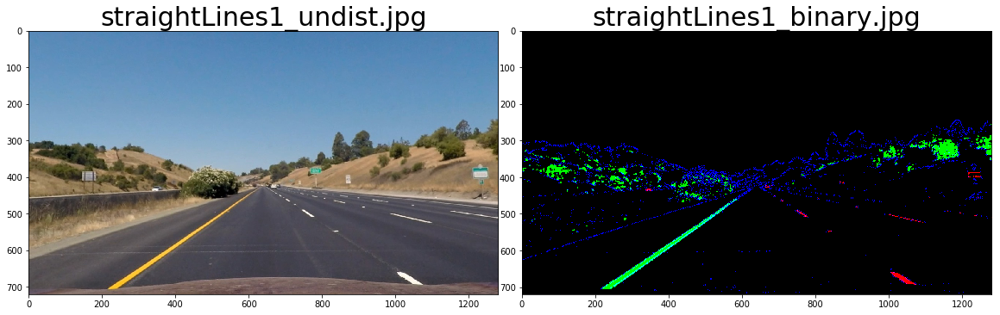

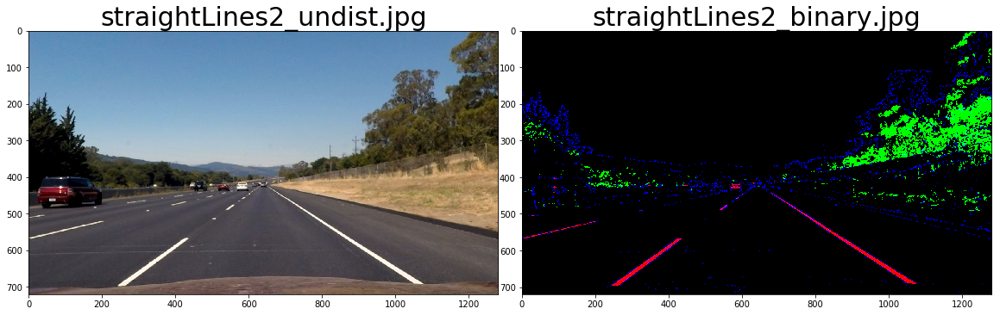

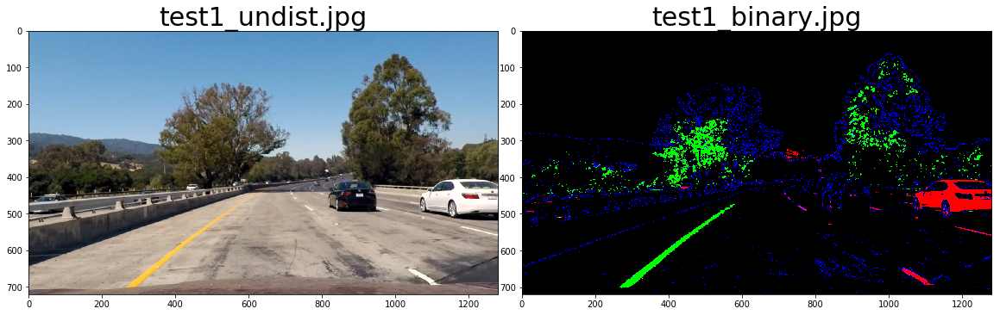

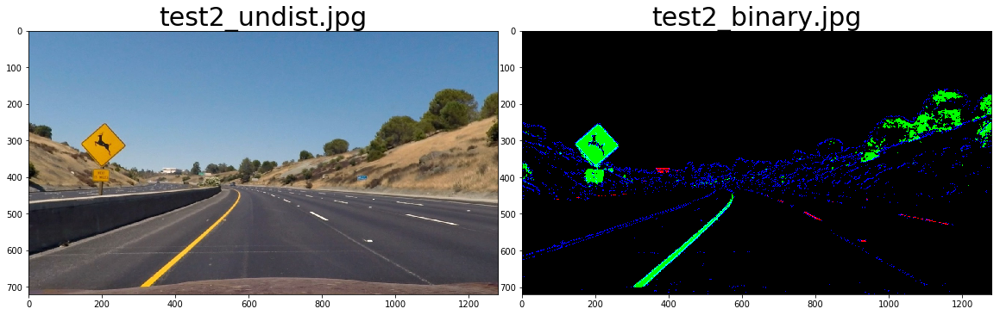

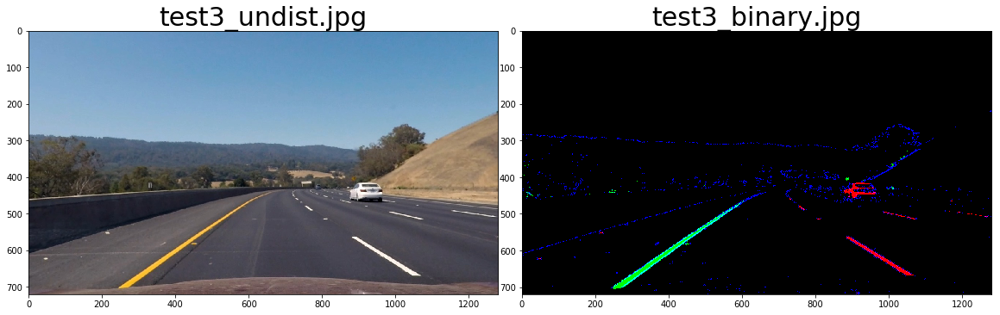

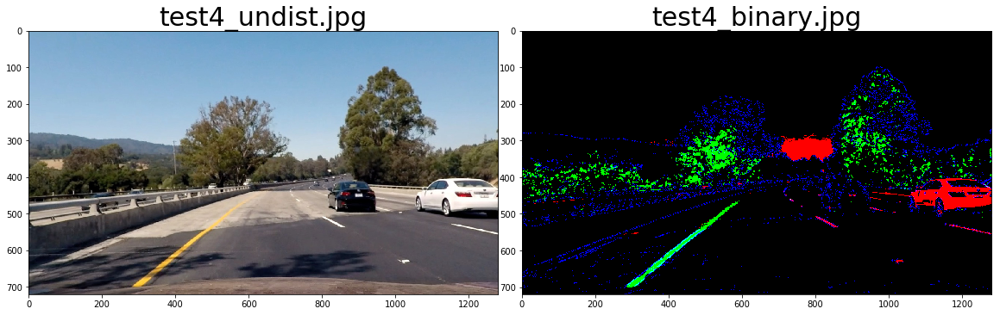

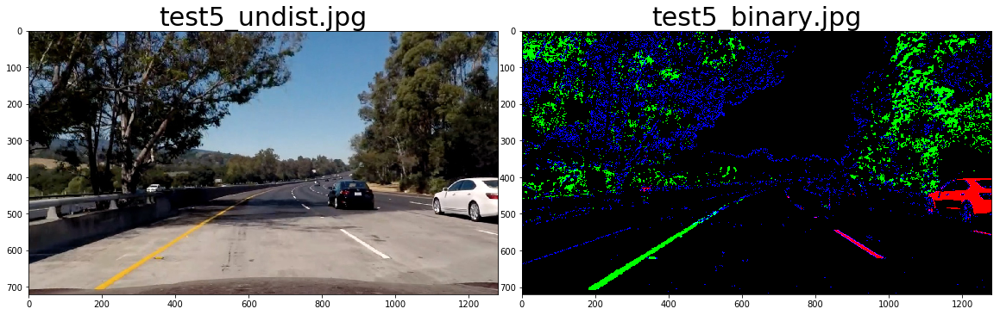

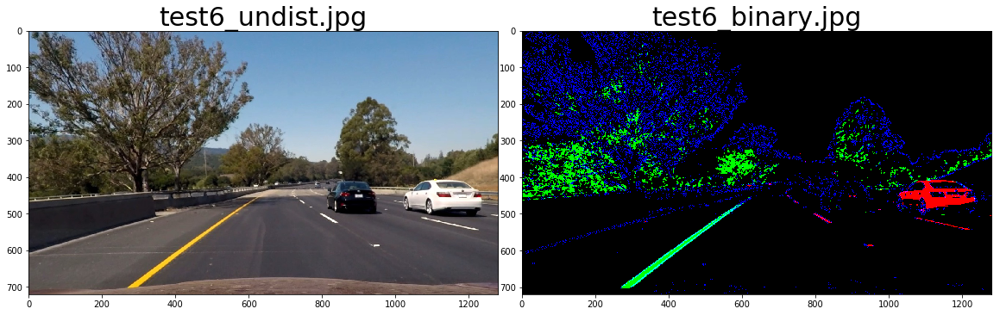

In [13]:
images = glob.glob('output_images/*_undist.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    test_img_binary= threshold(test_img,color=True)
    
    title= images[i].split('\\')[1]

    # Visualize unwarp
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(test_img)
    ax1.set_ylim([img_size[1],0])
    ax1.set_xlim([0,img_size[0]])
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_binary)
    ax2.set_title(title.split('_')[0]+'_binary.jpg', fontsize=30)

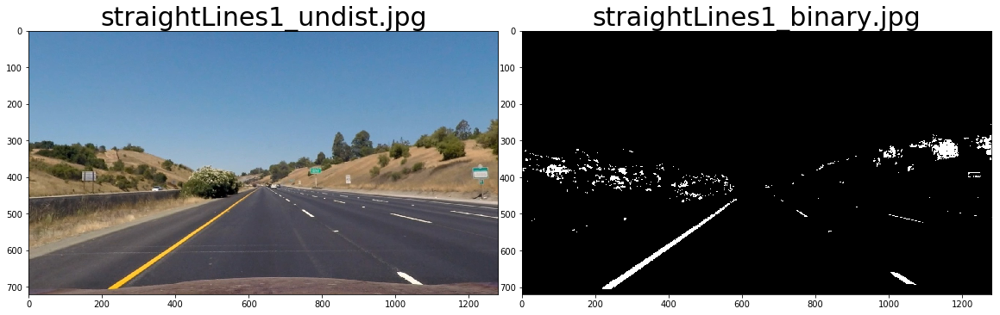

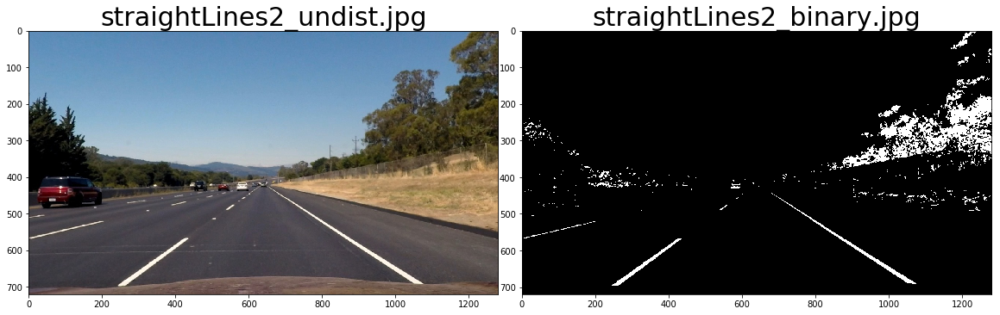

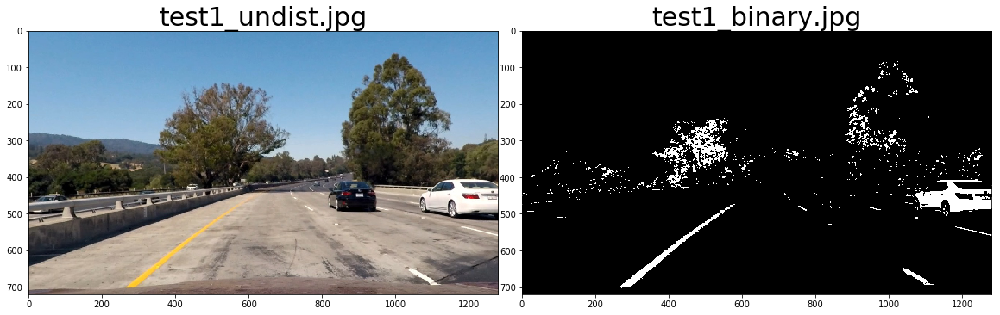

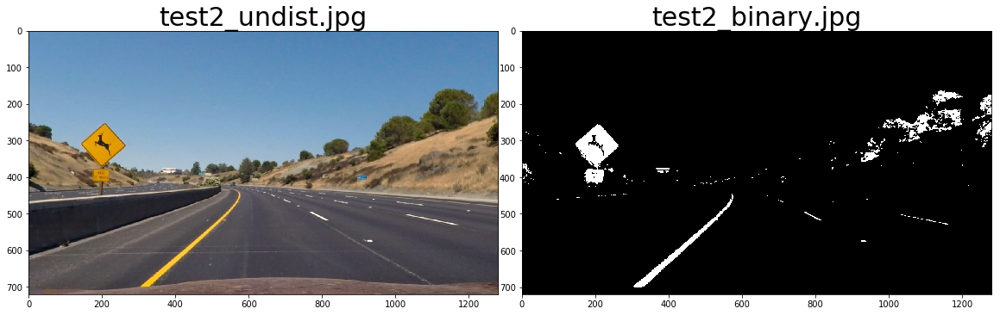

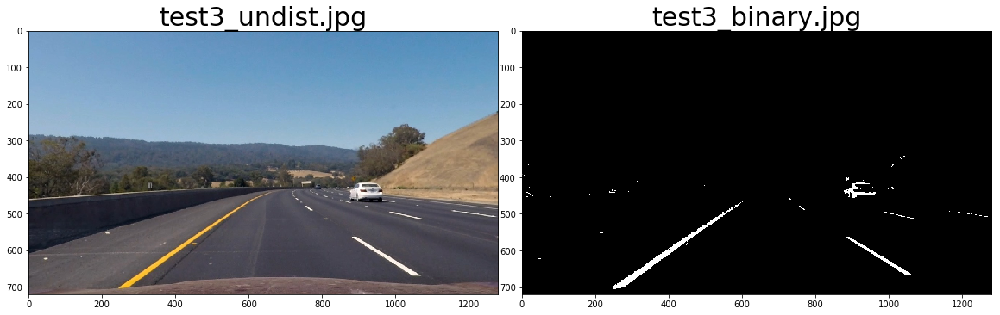

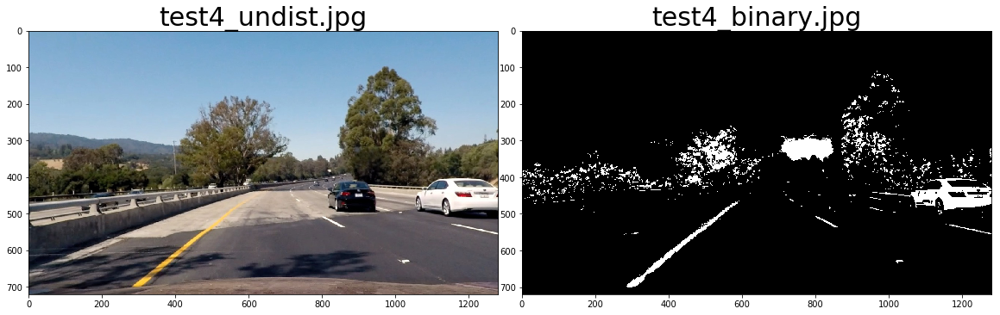

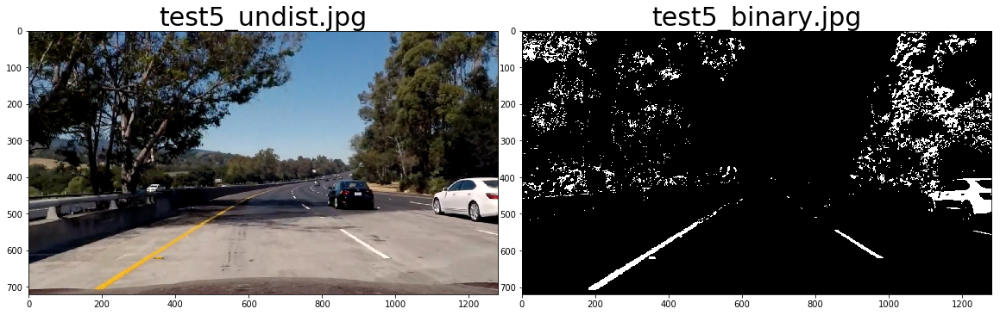

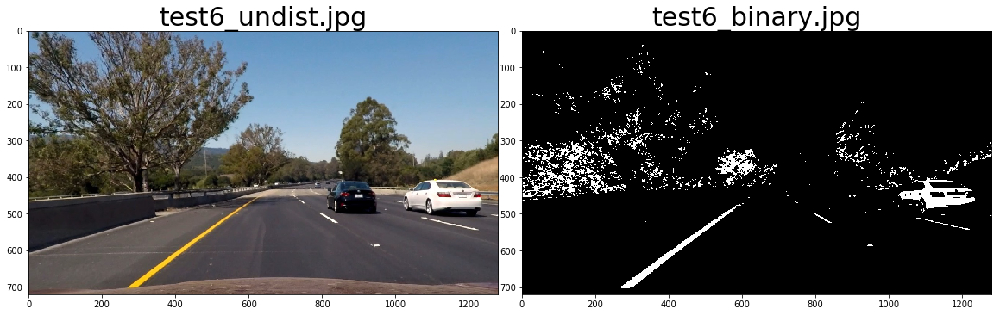

In [14]:
images = glob.glob('output_images/*_undist.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    test_img_binary= threshold(test_img,mag_dir_thresh=False)
    
    title= images[i].split('\\')[1]

        
    cv2.imwrite('output_images/'+title.split('_')[0]+'_binary.jpg',test_img_binary)

    # Visualize unwarp
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(test_img)
    ax1.set_ylim([img_size[1],0])
    ax1.set_xlim([0,img_size[0]])
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_binary, cmap='gray')
    ax2.set_title(title.split('_')[0]+'_binary.jpg', fontsize=30)

## 4.Perspective Transform

![Distortion Examples](examples/perspective1.png)
![Distortion Examples](examples/perspective2.png)

In [15]:
def unwarp(img, src, dst):
    image_shape = (img.shape[1],img.shape[0])
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, image_shape, flags=cv2.INTER_LINEAR)
    return warped, M, Minv


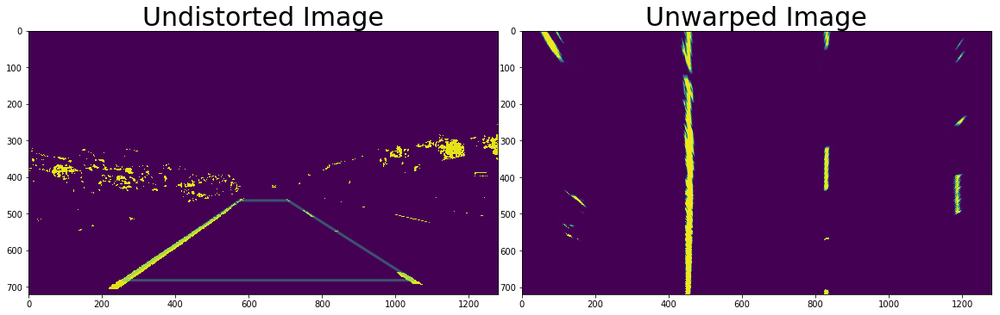

In [16]:
test_img=cv2.imread('output_images/straightLines1_binary.jpg')
test_img_undist = cv2.cvtColor(test_img, cv2.COLOR_RGB2GRAY)

# define source and destination points for transform
src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])
dst = np.float32([(450,0),
                  (img_size[0]-450,0),
                  (450,img_size[1]),
                  (img_size[0]-450,img_size[1])])

test_img_unwarped, M, Minv = unwarp(test_img_undist, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(test_img_undist)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([img_size[1],0])
ax1.set_xlim([0,img_size[0]])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(test_img_unwarped)
ax2.set_title('Unwarped Image', fontsize=30)

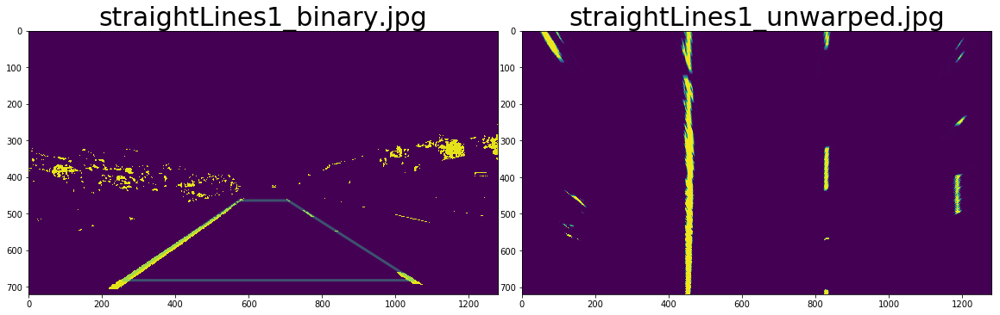

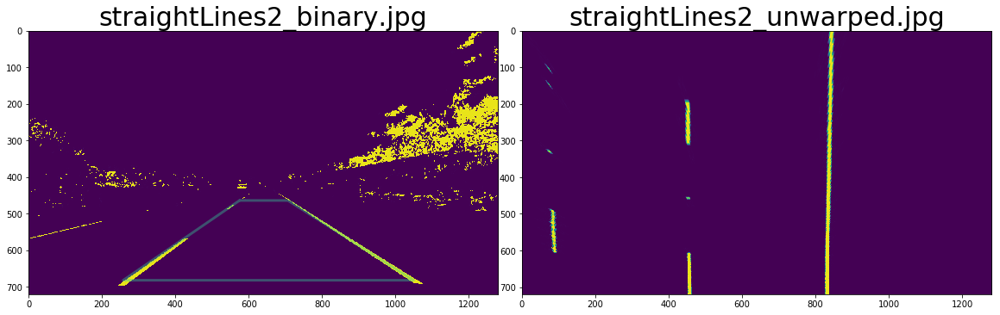

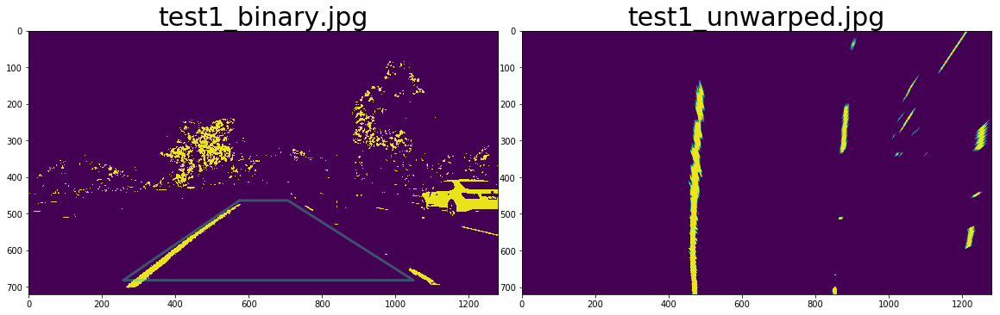

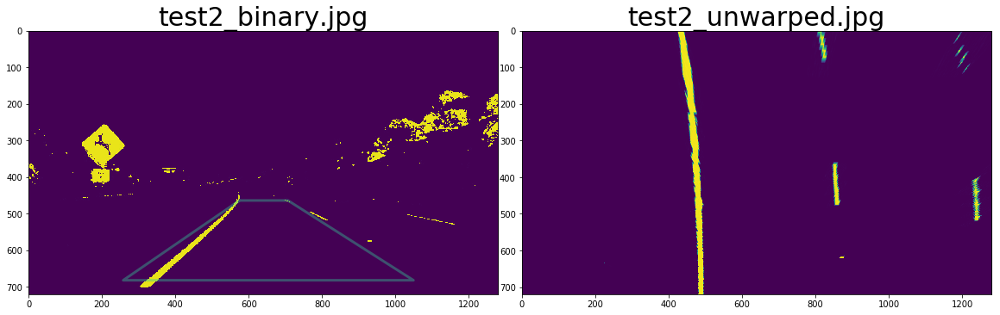

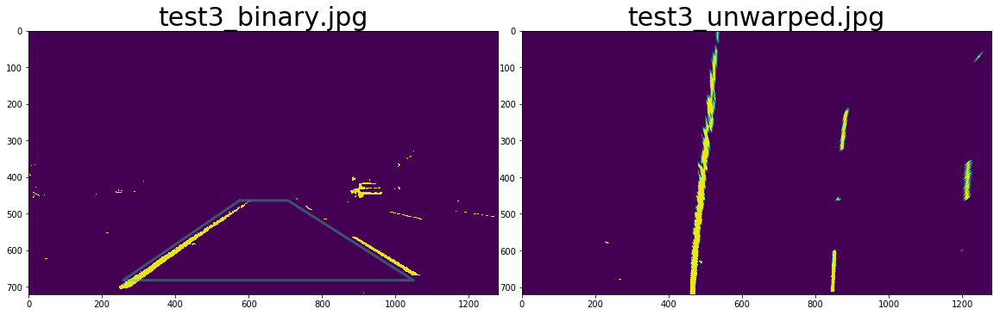

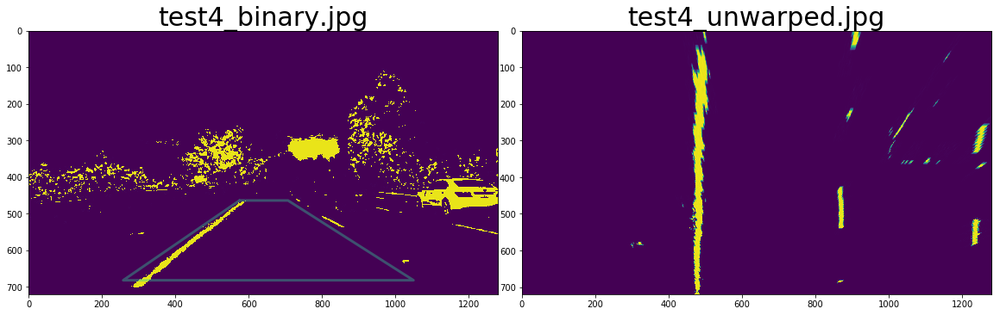

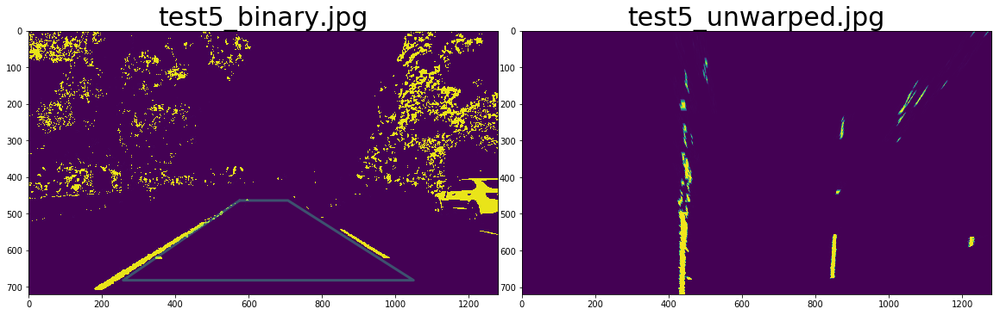

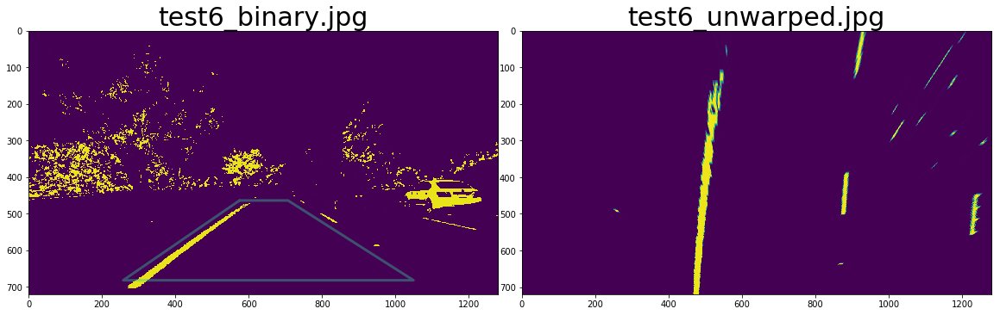

In [17]:
images = glob.glob('output_images/*_binary.jpg')


for i, fname in enumerate(images):
    test_img_rgb = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img_rgb, cv2.COLOR_RGB2GRAY)

    test_img_unwarped, M, Minv = unwarp(test_img, src, dst)
    
    title= images[i].split('\\')[1]

        
    cv2.imwrite('output_images/'+title.split('_')[0]+'_unwarped.jpg',test_img_unwarped)

    # Visualize unwarp
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(test_img)
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    ax1.set_ylim([img_size[1],0])
    ax1.set_xlim([0,img_size[0]])
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_unwarped)
    ax2.set_title(title.split('_')[0]+'_unwarped.jpg', fontsize=30)

## 5.Line detection

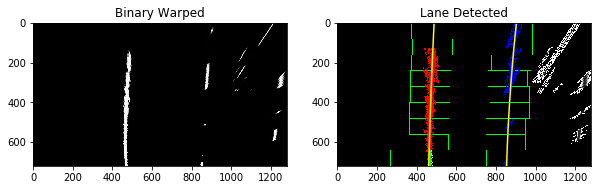

In [18]:
test_img= cv2.imread('output_images/test1_unwarped.jpg')
binary_warped = cv2.cvtColor(test_img, cv2.COLOR_RGB2GRAY)


# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

# Finding peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
offset = 100
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[offset:midpoint])
rightx_base = np.argmax(histogram[midpoint:-offset]) + midpoint

# Number of sliding windows
nwindows = 9

# Height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)

# Identifing the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])


# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base

# Margin in which to search
margin = 100

# Minimum number of pixels found to recenter window
minpix = 50

# Empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Steping through windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    
    # Drawing the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    
    # Identifing the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    
    # Appending these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    
    # Recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenating the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extracting left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
if leftx.size==0:
    left_fit=[0,0,0]
else:
    left_fit = np.polyfit(lefty, leftx, 2)
if rightx.size==0:
    right_fit=[0,0,0]
else:
    right_fit = np.polyfit(righty, rightx, 2)

## Visualization
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

plt.figure(figsize=(10,40))
plt.subplot(1,2,1)
plt.imshow(binary_warped, cmap='gray')
plt.title('Binary Warped')

plt.subplot(1,2,2)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.title('Lane Detected')

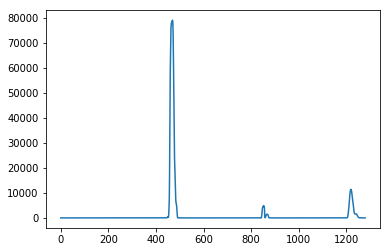

In [19]:
plt.plot(histogram)

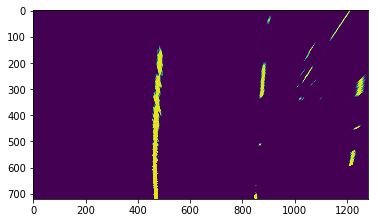

In [20]:
plt.imshow(binary_warped)

In [21]:

ym_per_pix = 3.0/72.0 # meters per pixel in y dimension
xm_per_pix = 3.7/660.0 # meters per pixel in x dimension
y_eval = 700
midx = 650

y1 = (2*left_fit[0]*y_eval + left_fit[1])*xm_per_pix/ym_per_pix
y2 = 2*left_fit[0]*xm_per_pix/(ym_per_pix*ym_per_pix)

curvature = ((1 + y1*y1)**(1.5))/np.absolute(y2)
print("Radius of Curvature: %f" % curvature)

Radius of Curvature: 8659.543936


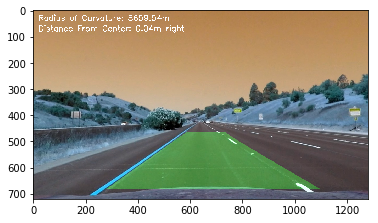

In [22]:
undistorted_img = cv2.imread('output_images\\straightLines1_undist.jpg')

ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted_img.shape[1], undistorted_img.shape[0])) 

# Combine the result with the original image
result = cv2.addWeighted(undistorted_img, 1, newwarp, 0.3, 0)

cv2.putText(result,'Radius of Curvature: %.2fm' % curvature,(20,40), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)

x_left_pix = left_fit[0]*(y_eval**2) + left_fit[1]*y_eval + left_fit[2]
x_right_pix = right_fit[0]*(y_eval**2) + right_fit[1]*y_eval + right_fit[2]
position_from_center = ((x_left_pix + x_right_pix)/2 - midx) * xm_per_pix
if position_from_center < 0:
    text = 'left'
else:
    text = 'right'
cv2.putText(result,'Distance From Center: %.2fm %s' % (np.absolute(position_from_center), text),(20,80), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
plt.imshow(result)

In [23]:
def line_detect(binary_warped,undistorted_img,Minv):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Finding peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    offset =100
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[offset:midpoint])
    rightx_base = np.argmax(histogram[midpoint:-offset]) + midpoint

    # Number of sliding windows
    nwindows = 9

    # Height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identifing the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])


    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Margin in which to search
    margin = 100

    # Minimum number of pixels found to recenter window
    minpix = 50

    # Empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Steping through windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Drawing the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

        # Identifing the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Appending these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # Recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenating the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    if leftx.size==0:
        left_fit=[0,0,0]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    if rightx.size==0:
        right_fit=[0,0,0]
    else:
        right_fit = np.polyfit(righty, rightx, 2)

    ## Visualization
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    ym_per_pix = 3.0/72.0 # meters per pixel in y dimension
    xm_per_pix = 3.7/660.0 # meters per pixel in x dimension
    y_eval = 700
    midx = 650

    y1 = (2*left_fit[0]*y_eval + left_fit[1])*xm_per_pix/ym_per_pix
    y2 = 2*left_fit[0]*xm_per_pix/(ym_per_pix*ym_per_pix)
    
    curvature = ((1 + y1*y1)**(1.5))/np.absolute(y2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistorted_img.shape[1], undistorted_img.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_img, 1, newwarp, 0.3, 0)

    cv2.putText(result,'Radius of Curvature: %.2fm' % curvature,(20,40), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)

    x_left_pix = left_fit[0]*(y_eval**2) + left_fit[1]*y_eval + left_fit[2]
    x_right_pix = right_fit[0]*(y_eval**2) + right_fit[1]*y_eval + right_fit[2]
    position_from_center = ((x_left_pix + x_right_pix)/2 - midx) * xm_per_pix
    if position_from_center < 0:
        text = 'left'
    else:
        text = 'right'
    cv2.putText(result,'Distance From Center: %.2fm %s' % (np.absolute(position_from_center), text),(20,80), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)

    
    return result
    

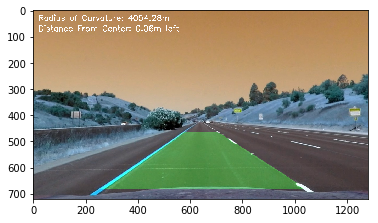

In [24]:
test_img= cv2.imread('output_images/straightLines1_unwarped.jpg')
undistorted_img = cv2.imread('output_images\\straightLines1_undist.jpg')

binary_warped = cv2.cvtColor(test_img, cv2.COLOR_RGB2GRAY)

result=line_detect(binary_warped,undistorted_img,Minv)
plt.imshow(result)

Pipeline

In [25]:
def process_image(image):
    image_undist = cv2.undistort(image, mtx, dist, None, mtx)
    image_thresholded = threshold(image_undist,mag_dir_thresh=False)
    image_unwarped, M, Minv = unwarp(image_thresholded, src, dst)
    
    result=line_detect(image_unwarped,image_undist,Minv)

    
    
    return result

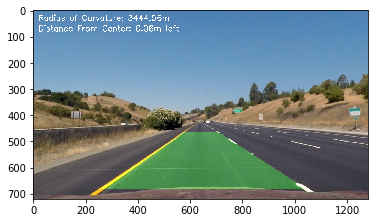

In [26]:
test_img= cv2.imread('test_images/straightLines1.jpg')
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
test_img_result=process_image(test_img)
plt.imshow(test_img_result)

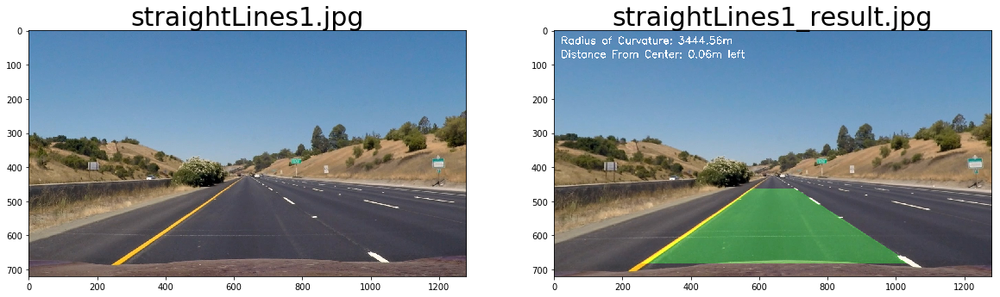

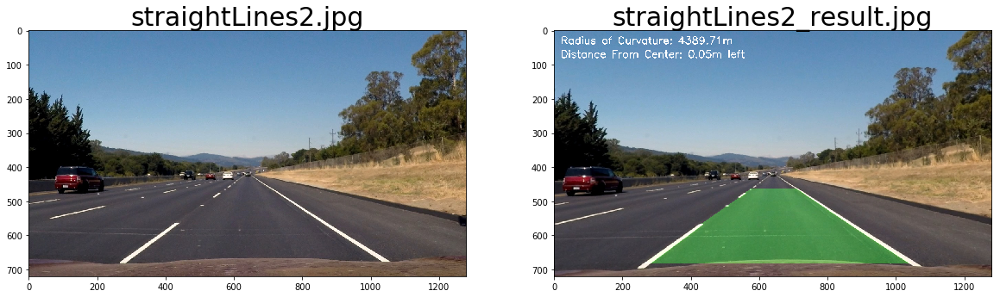

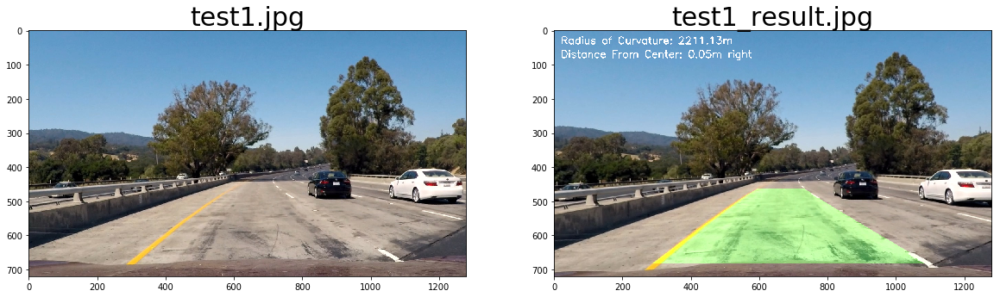

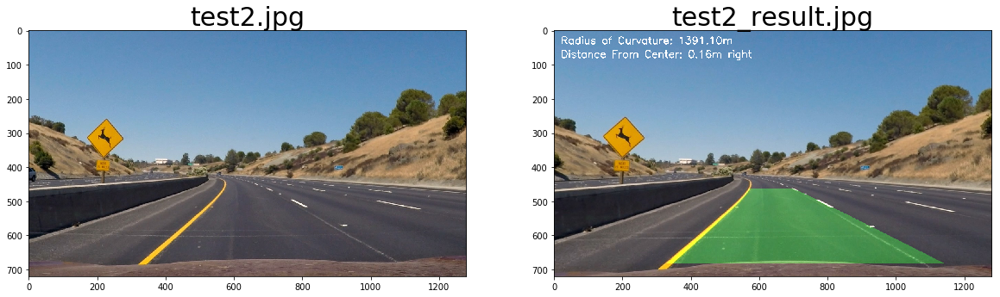

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


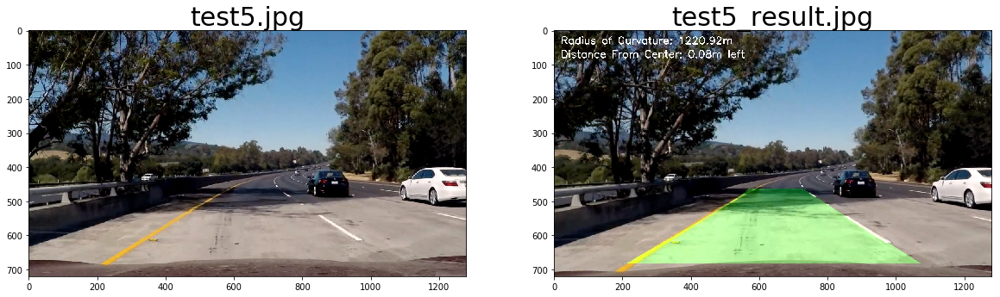

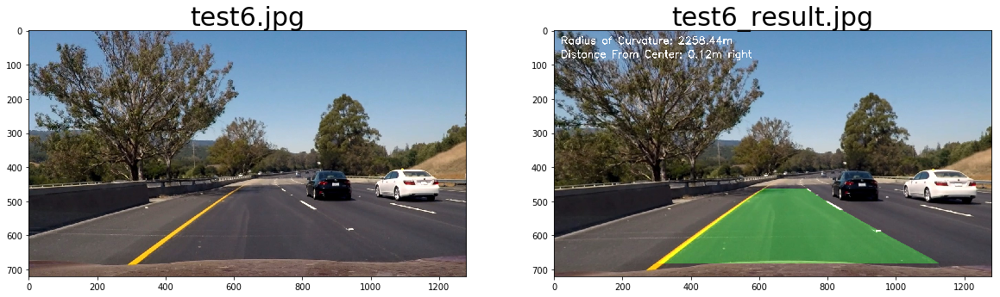

In [27]:
images = glob.glob('test_images/*.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    test_img_result=process_image(test_img)

    title= images[i].split('\\')[1]

        
    cv2.imwrite('output_images/'+title.split('.')[0]+'_result.jpg',test_img_result)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_result)
    ax2.set_title(title.split('.')[0]+'_result.jpg', fontsize=30)

In [28]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [29]:
white_output = 'output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output/project_video.mp4
[MoviePy] Writing video output/project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [02:59<00:00,  7.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/project_video.mp4 

Wall time: 3min 1s


In [30]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [31]:
challenge_output = 'output/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip2 = VideoFileClip("challenge_video.mp4")
white_clip = clip2.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video output/challenge_video.mp4
[MoviePy] Writing video output/challenge_video.mp4


100%|████████████████████████████████████████| 485/485 [01:03<00:00,  7.47it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/challenge_video.mp4 

Wall time: 1min 5s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [ ]:
harderchallenge_output = 'output/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip3 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip3.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(harderchallenge_output, audio=False)

[MoviePy] >>>> Building video output/harder_challenge_video.mp4
[MoviePy] Writing video output/harder_challenge_video.mp4


 90%|██████████████████████████████████▎   | 1082/1200 [02:59<00:20,  5.82it/s]

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harderchallenge_output))